In [1]:
!pip install pandas

Загружаем данные

In [2]:
import requests
import time
import pandas as pd

In [3]:
with open('Lab1.zip', 'wb') as fh:
  resp = requests.get('https://github.com/DimaKurd/cv_lab1/raw/master/lab1/Lab1.zip')
  fh.write(resp.content)

In [4]:
! unzip Lab1.zip -d .

Archive:  Lab1.zip
   creating: ./images/
  inflating: ./images/Abyssinian_122.jpg  
  inflating: ./images/Abyssinian_19.jpg  
  inflating: ./images/Abyssinian_210.jpg  
  inflating: ./images/Abyssinian_24.jpg  
  inflating: ./images/Abyssinian_31.jpg  
  inflating: ./images/Abyssinian_44.jpg  
  inflating: ./images/Abyssinian_66.jpg  
  inflating: ./images/Abyssinian_9.jpg  
  inflating: ./images/american_bulldog_140.jpg  
  inflating: ./images/american_bulldog_199.jpg  
  inflating: ./images/american_bulldog_95.jpg  
  inflating: ./images/basset_hound_118.jpg  
  inflating: ./images/basset_hound_14.jpg  
  inflating: ./images/basset_hound_181.jpg  
  inflating: ./images/beagle_1.jpg   
  inflating: ./images/beagle_180.jpg  
  inflating: ./images/Bengal_103.jpg  
  inflating: ./images/Bengal_147.jpg  
  inflating: ./images/Bengal_50.jpg  
  inflating: ./images/Birman_31.jpg  
  inflating: ./images/Birman_7.jpg   
  inflating: ./images/Bombay_16.jpg  
  inflating: ./images/Bombay_48.jp

Метод для обработки изображения

In [5]:
from IPython.core.interactiveshell import prefilter
import os, cv2
import pandas as pd, numpy as np
from typing import List
from google.colab.patches import cv2_imshow

def get_foreground_mask(image_path: str, show=False, param=1) -> List[tuple]:

    img = cv2.imread(image_path)

    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    if show:
       cv2_imshow(img)

    img_op = cv2.Canny(img, 23, 74)

    if show:
      cv2_imshow(img_op)

    close = img_op


    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (40, 26))
    close = cv2.morphologyEx(img_op, cv2.MORPH_CLOSE, kernel)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (12, 13))
    close = cv2.morphologyEx(close, cv2.MORPH_CLOSE, kernel)

    if show:
      cv2_imshow(close)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 9))
    dilated = cv2.dilate(close,kernel,iterations = 1)

    if show:
      cv2_imshow(dilated)

    pred_points = np.argwhere(dilated)

    return pred_points


#Тест

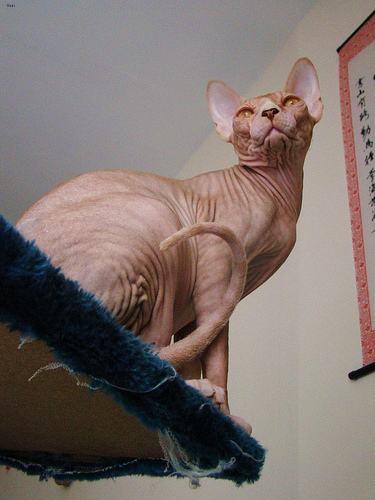

10
30
50
70
90


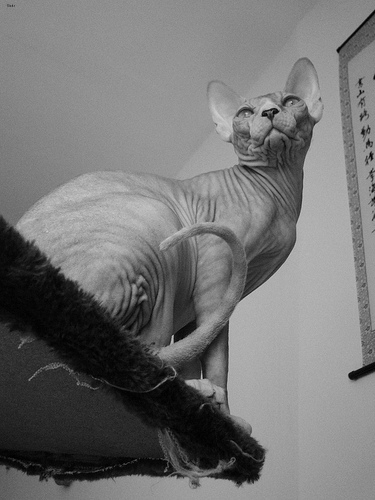

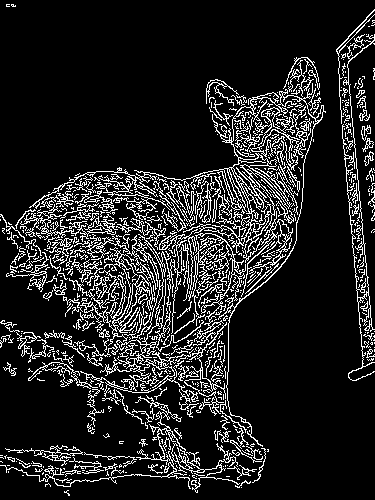

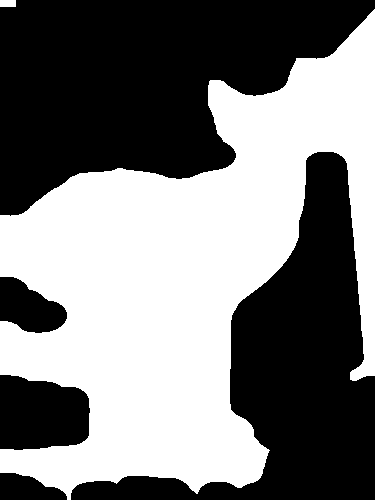

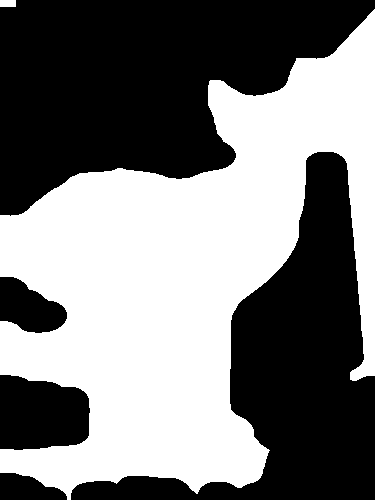

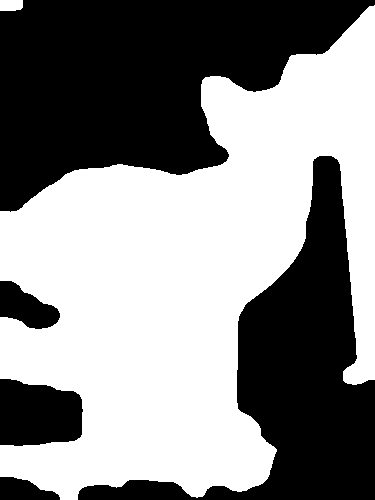

In [ ]:
#image_path="./images/staffordshire_bull_terrier_67.jpg"
#image_path="./images/Persian_221.jpg"
#image_path="./images/Russian_Blue_180.jpg"
image_path="./images/Sphynx_33.jpg"
cv2_imshow(cv2.imread(image_path))
for i in range(10, 100, 20):
   print(i)
get_foreground_mask(image_path, show=True, param=i);

#Расчёт метрики

In [6]:
def evaluate_iou(image_dir: str, anno_dir: str) -> float:
    """
    Метод для расчёта mean IoU на датасете
    :param image_dir - каталог с фото для анализа
    :param anno_dir - каталог с аннотациями для расчета метрики
    :return значение mean IoU с сохранением оценки по каждому фото в csv-файл
    """

    iou_data = dict()
    images_size = 0
    images = []
    start_time = time.time()

    for _, _, files in os.walk(image_dir):
        assert files is not None, 'no files read'
        for image_name in files:
            # print(f'Processing file {image_name}')

            sample_name = image_name[:image_name.find('.jpg')]

            # acquiring ground truth mask data
            mask_true = cv2.imread(os.path.join(anno_dir, f'{sample_name}.png'))
            assert mask_true is not None, 'mask is None'
            images_size += mask_true.shape[:2][0]*mask_true.shape[:2][1]
            true_points = cv2.cvtColor(mask_true, cv2.COLOR_BGR2GRAY)
            true_points[true_points != 2] = 1
            true_points[true_points == 2] = 0
            true_points = np.argwhere(true_points)
            true_points_set = set([tuple(x) for x in true_points])

            # acquiring predicted mask
            pred_points = get_foreground_mask(image_path=os.path.join(image_dir, image_name), show=True)
            assert pred_points is not None, 'pred_points is None'
            pred_points_set = set([tuple(x) for x in pred_points])

            # calculating IoU
            iou = len(true_points_set.intersection(pred_points_set)) / len(true_points_set.union(pred_points_set))

            image_names = iou_data.get('image_names', [])
            image_names.append(sample_name)
            iou_data['image_names'] = image_names

            iou_values = iou_data.get('iou_values', [])
            iou_values.append(iou)
            iou_data['iou_values'] = iou_values

        # pd.DataFrame(data=iou_data).to_csv('detailed_results.csv')
        time_consumed = time.time()-start_time
        return pd.DataFrame(iou_data), images, images_size, time_consumed

# Вызов расчёта метрики


0.8933767149026346

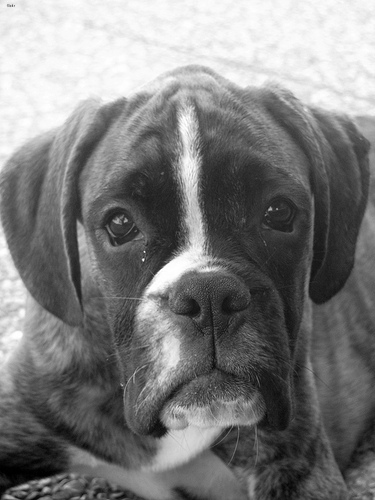

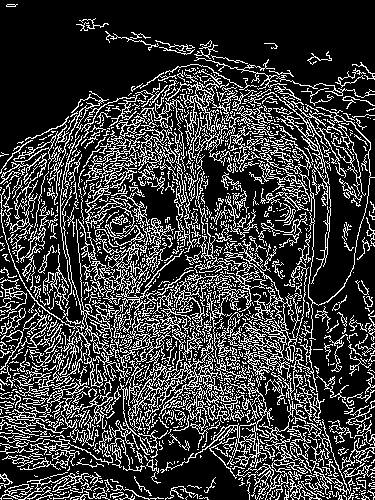

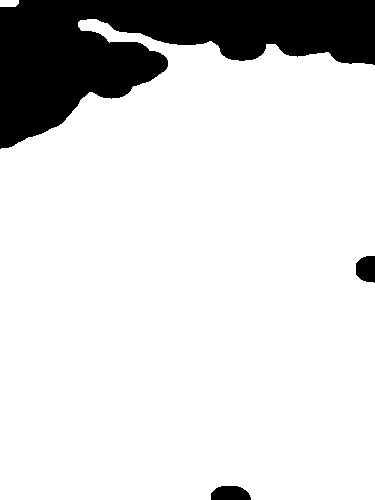

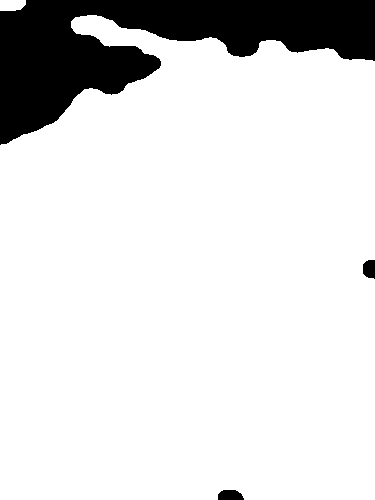

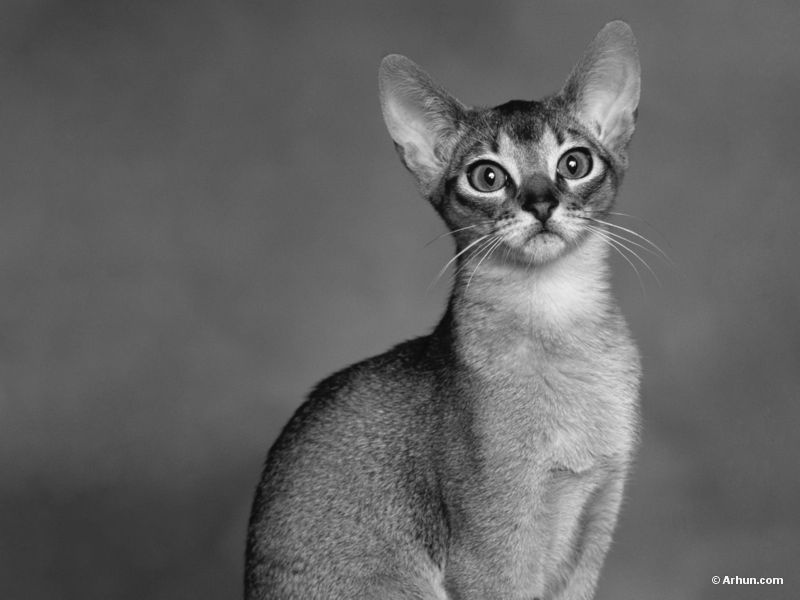

...

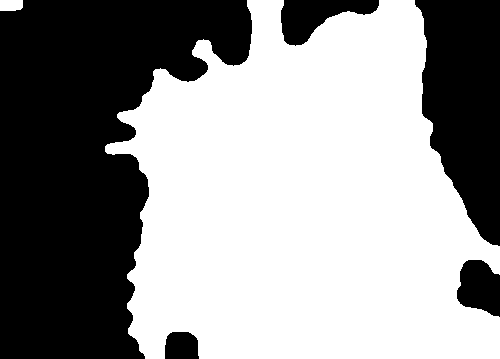

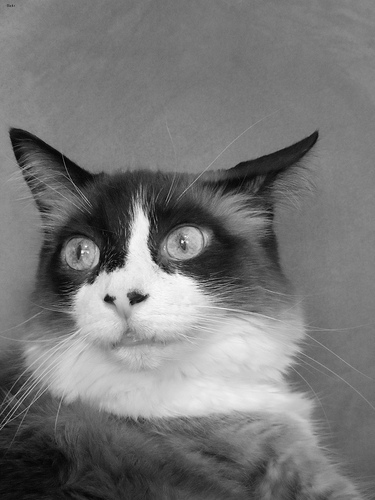

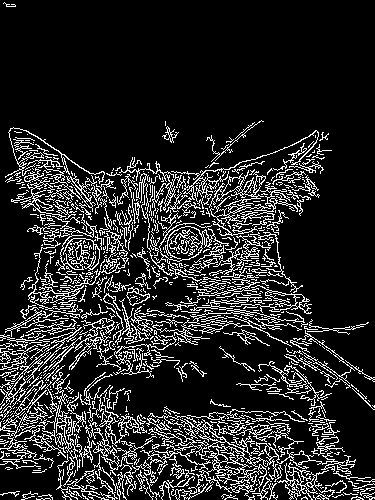

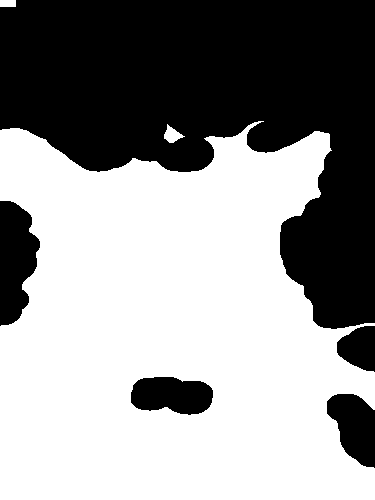

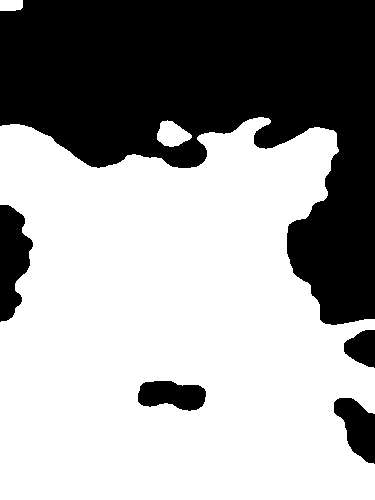

Metric_value 0.8933767149026346
Process time: 87.32234787940979
Process speed: 4.15 s/Mpx


In [7]:
metric_data, images, images_size, time_consumed = evaluate_iou(image_dir='./images', anno_dir='./annotations')

print(f"Metric_value {np.mean(metric_data['iou_values'])}")
print(f"Process time: {time_consumed}")
print(f"Process speed: {time_consumed/(images_size/1e+6):.2f} s/Mpx")

In [ ]:
time_consumed/(images_size/1e+10)

39694.45034554131

In [ ]:
metric_data.sort_values("iou_values", ascending=True)

,image_names,iou_values
28,Sphynx_33,0.536080
22,english_setter_96,0.719787
71,english_cocker_spaniel_144,0.752991
76,shiba_inu_140,0.776930
2,Russian_Blue_171,0.780839
...,...,...
62,staffordshire_bull_terrier_67,0.955723
26,shiba_inu_72,0.958294
8,pug_13,0.962442
97,leonberger_2,0.962646
